### Categorizing the type of leaf disease from Apple tree

#### Problem Statement 

Predicting healthiness/disease of an apple tree based on leaf image

### 1. Data Loading

In [ ]:
import pandas as pd
import cv2
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

!pip install lime
import numpy as np
import keras
from keras.applications.imagenet_utils import decode_predictions
import copy
import sklearn
import sklearn.metrics
from sklearn.linear_model import LinearRegression

import skimage.io 
import skimage.segmentation


In [ ]:
!pip install kaggle
!mkdir kaggle

In [3]:
#need to be executed while downloading data-->> environment for downloading
import os
os.environ['KAGGLE_USERNAME'] = "interioamar" # username from the json file
os.environ['KAGGLE_KEY'] = "xxxxxx6c48cxxxxc3627xxxxxxx" # key from the json file

In [4]:
#https://stackoverflow.com/questions/51958553/error-while-importing-kaggle-dataset-on-colab
! echo chmod 600 ~/kaggle/kaggle.json

chmod 600 /root/kaggle/kaggle.json


In [5]:
!kaggle competitions download -c plant-pathology-2020-fgvc7

 99% 770M/779M [00:22<00:00, 42.8MB/s]
100% 779M/779M [00:22<00:00, 36.4MB/s]


In [ ]:
##unzipping the data
#https://askubuntu.com/questions/219392/how-can-i-uncompress-a-7z-file
!sudo apt install p7zip-full -y
!7z x plant-pathology-2020-fgvc7.zip

In [7]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

print('Train & Test data shape: ', train_df.shape,test_df.shape) #test_df will have only image_id in it 
train_df.head(5)

Train & Test data shape:  (1821, 5) (1821, 1)


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
import h5py
import tensorflow as tf
from tensorflow.keras.models import load_model #for saving model weights
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

In [10]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")
def append_ext(fn):
    return fn+".jpg"

train_df["image_id"]=train_df["image_id"].apply(append_ext)
test_df["image_id"]=test_df["image_id"].apply(append_ext)

In [11]:
from keras_preprocessing.image import ImageDataGenerator
train_datagen=ImageDataGenerator(rescale=1./255.

                                 ,width_shift_range=0.2 
                                ,zoom_range=0.2
                                ,horizontal_flip=True 
                                ,validation_split=0.20)
val_datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.20)

In [12]:
train_generator=train_datagen.flow_from_dataframe(
dataframe=train_df,
directory="./images/",
x_col="image_id",
y_col=train_df.columns[1:].str.replace(' ', ''),
subset="training",
batch_size=16,
seed=42,
shuffle=True,
class_mode="raw",
target_size=(320,512))

valid_generator=val_datagen.flow_from_dataframe(
dataframe=train_df,
directory="./images/",
x_col="image_id",
y_col=train_df.columns[1:].str.replace(' ', ''),
subset="validation",
batch_size=16,
seed=42,
shuffle=False, #is required to freeze the validation data while testing else different result is obtained 
class_mode="raw", #https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c
target_size=(320,512))

Found 1457 validated image filenames.
Found 364 validated image filenames.


In [13]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test_df,
directory="./images/",
x_col="image_id",
y_col=None,
batch_size=1,
seed=42,
shuffle=False,
class_mode=None,
target_size=(320,512))

Found 1821 validated image filenames.


### Model-1 DenseNet121(with Data Augmentation) Analysis


In [ ]:
loaded_model = tf.keras.models.load_model('/content/drive/My Drive/best_model_dense.hdf5')

 23/364 [>.............................] - ETA: 3:42

364/364 [==============================] - 29s 40ms/step


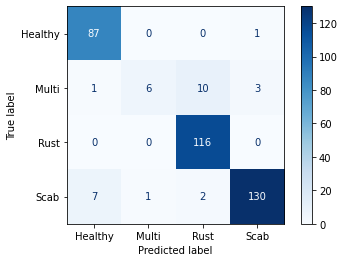

In [ ]:
valid_generator.reset()
pred_1=loaded_model.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)

#plotting function of accuracy,loss and auc
    
    #confusion_matrix on each fold
class_labels = ["Healthy", "Multi", "Rust", "Scab"]
cm = confusion_matrix(np.asarray(valid_generator._targets).argmax(axis=1), np.asarray(pred_1).argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()

#### Observations:
* 9.13% accuracy achieved on validation data
* Actual "multi_disease" class leaves are clasified as rust,scab and healthy. So we will be checking the pattern of misclassifying leaves
* Scab leaves are misclassified as "healthy leaves which needs to be analysed 

In [ ]:
# np.save('Prediction_loaded_model.npy',pred_1)

In [ ]:
pred_1=np.load('Prediction_loaded_model.npy')

#### Note:
* Here Class labels are label-encoded as 0,1,2 & 3 for "Healthy", "Multi", "Rust", "Scab" categories respectively
* From the Confusion matrix, We observe Multi_Disease classes are classified wrongly as rust class in prediction followed by "scab" class
* Here we tried by varying the image size from 320X512 to 512X512 and 720X720 but accuracy was decreasing. So best size 320X512 image size is choosen for further error analysis

In [ ]:
label_df=pd.DataFrame({'Actual_label':np.asarray(valid_generator._targets).argmax(axis=1),'Predicted_label':np.asarray(pred_1).argmax(axis=1)})
a=valid_generator._filepaths
label_df.insert(0,'image_id',pd.Series(a))
label_df.head(3)

,image_id,Actual_label,Predicted_label
0,./images/Train_0.jpg,3,3
1,./images/Train_1.jpg,1,1
2,./images/Train_2.jpg,0,0


In [ ]:
print("Total number of misclassified point are: ",len(label_df[label_df['Actual_label']!=label_df['Predicted_label']]))

Total number of misclassified point are:  25


In [ ]:
#Testing with one sample
# list(label_df[label_df['image_id']=='./images/Train_25.jpg']['Predicted_label'])
# segment_top_pixel(10,loaded_model,'./images/Train_25.jpg',1)

25    ./images/Train_25.jpg
Name: image_id, dtype: object

In [ ]:
##https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5
def segment_top_pixel(num_top_features,loaded_model,image_loc_id,i=1):
    """ num_top_features : Show the top pixel which classifies the leaves category
        loaded_model   :Saved weights of the model trained
        image_loc_id  : ex: ./images/Train_2.jpg
        i  : to show more images pattern by default sigle input so 1
        num_top_features : no of pixel to select 
    """

    #printing the original image
    plt.figure(figsize=(10,8))
    plt.subplot(1,3,1)
    image=cv2.imread(image_loc_id)
    image=cv2.resize(image, (512, 512),interpolation = cv2.INTER_NEAREST)
    plt.imshow(image)
    plt.title('{}'.format(j.split('/')[-1]))
    plt.axis('off')


    #printing the segmentation based on kernel (it is random segmentation)
    superpixels = skimage.segmentation.quickshift(image, kernel_size=5,max_dist=200, ratio=0.2,random_seed=42)
    num_superpixels = np.unique(superpixels).shape[0] #number of pixel to make the segmentation
    plt.subplot(1,3,2)
    skimage.io.imshow(skimage.segmentation.mark_boundaries(image, superpixels))
    plt.title('Segmened_image')
    plt.axis('off')


    #pertubation for randomly masking the image segments
    num_perturb = 50
    perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels)) 

    def perturb_image(img,perturbation,segments):
      active_pixels = np.where(perturbation == 1)[0] #taking only true part pertubation=1
      mask = np.zeros(segments.shape)
      for active in active_pixels:
          mask[segments == active] = 1  #masking the segments(superpixels) with pertubation=1
      perturbed_image = copy.deepcopy(img)
      perturbed_image = perturbed_image*mask[:,:,np.newaxis]
      return perturbed_image


    predictions = []

    #the below loop is performing prediction with masked and unmasked pixel of an image and storing the result and it iterates for no of pertubation choosen
    for pert in perturbations: #here it is looped to each pixel masked (num_perturb)
      perturbed_img = perturb_image(image/255,pert,superpixels) #passing into masking masking fuction
      pred = loaded_model.predict(perturbed_img[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
      predictions.append(pred)

    predictions = np.array(predictions) #storing all 150 set in an array

    original_image = np.ones(num_superpixels)[np.newaxis,:] #Perturbation with all superpixels enabled

    distances = sklearn.metrics.pairwise_distances(perturbations,original_image, metric='cosine').ravel() #finding the distance from (1,1,1) to randomly masked pixel set

    #predicting the classes with highest probability
    np.random.seed(42)
    preds = loaded_model.predict(image[np.newaxis,:,:,:])
    top_pred_classes = preds[0].argsort()[-4:][::-1] #all the classes priority is predicted

    kernel_width = 0.25
    weights = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function RBL (Radial Basis Function)
    class_to_explain = top_pred_classes[0] 


    simpler_model = LinearRegression() #performing LR and fitting model for prediction of all the points and getting the maxium coefficient value from the prediction
    simpler_model.fit(X=perturbations, y=predictions[:,:,class_to_explain], sample_weight=weights)
    coeff = simpler_model.coef_[0] #(n_targets
    #predicts all the superpixel among which we will select the top 4 values which has highest values of predicted pixels
    
    top_features = np.argsort(coeff)[-num_top_features:] 

    plt.subplot(1,3,3)
    mask = np.zeros(num_superpixels) 
    mask[top_features]= True #Activate top superpixels
    skimage.io.imshow(perturb_image(image/255,mask,superpixels))
    plt.title('Predicted_label for region : {}'.format(list(label_df[label_df['image_id']==image_loc_id]['Predicted_label'])))
    plt.axis('off')
 


#### Analysis of "Multi_disease" category misclassification

In [ ]:
multi_d_misclas_id=pd.Series(label_df[label_df['Actual_label']==1][label_df['Actual_label']!=label_df['Predicted_label']]['image_id'])

In [ ]:
print("Total misclassfied labels for multi_disease category are: ",len(multi_d_misclas_id))

Total misclassfied labels for multi_disease category are:  14


In [ ]:
#https://stackoverflow.com/questions/12096252/use-a-list-of-values-to-select-rows-from-a-pandas-dataframe  -->> get full data from list of values in dataframe
label_df[label_df['image_id'].isin(list(multi_d_misclas_id[:3]))]

,image_id,Actual_label,Predicted_label
25,./images/Train_25.jpg,1,3
95,./images/Train_95.jpg,1,2
104,./images/Train_104.jpg,1,0


0it [00:00, ?it/s]

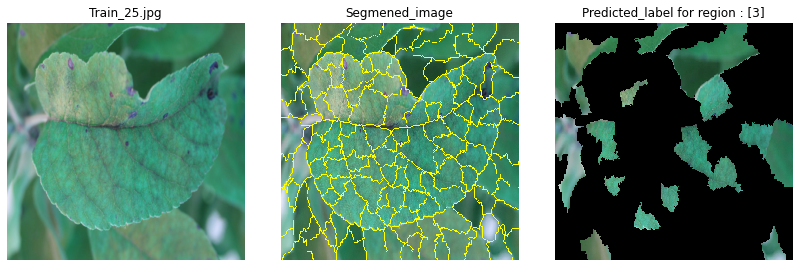

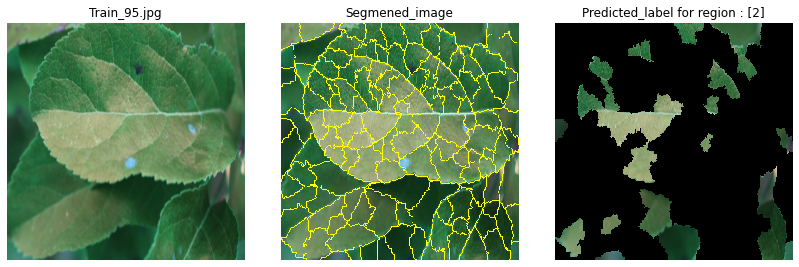

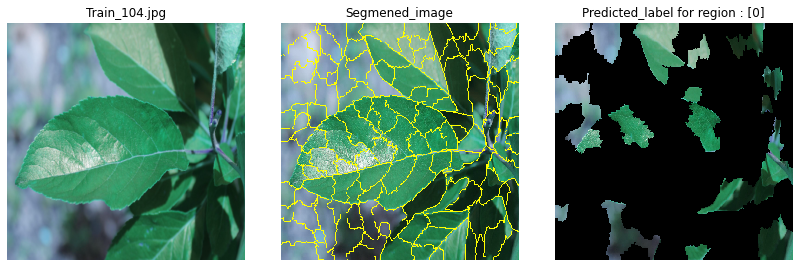

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(multi_d_misclas_id[:3])):
  segment_top_pixel(30,loaded_model,j,i+1)

#### Observations:

* for Train_25.jpg, model lags in capturing the rust and scab regions in the prediction thereby making not classifying to "multi_disease" category
* Image Train_95.jpg is having more rust region but model is not capturing the disease region so failing to categorize the correct one
* We see "Train_104.jpg" actually looks like "healthy" image and it it predicted the same. But ground truth is "multi_disease" class. So it could be considered as wrong input label. 

#### Analysis of "Scab" category misclassification

In [ ]:
scab_misclas_id=pd.Series(label_df[label_df['Actual_label']==3][label_df['Actual_label']!=label_df['Predicted_label']]['image_id'])

In [ ]:
print("Total misclassfied labels for scab category are: ",len(scab_misclas_id))

Total misclassfied labels for scab category are:  10


In [ ]:
label_df[label_df['image_id'].isin(list(scab_misclas_id[:3]))]

,image_id,Actual_label,Predicted_label
22,./images/Train_22.jpg,3,2
27,./images/Train_27.jpg,3,0
28,./images/Train_28.jpg,3,0


0it [00:00, ?it/s]

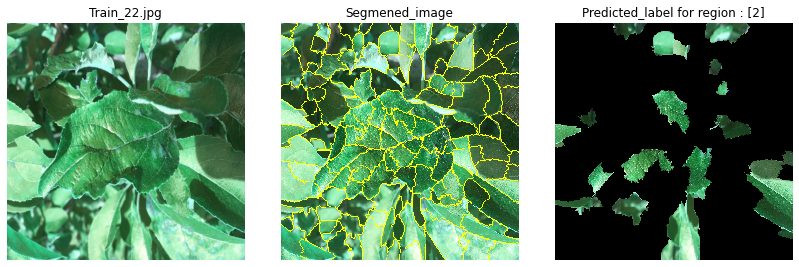

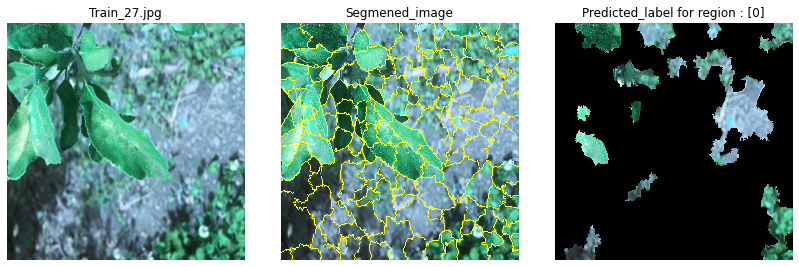

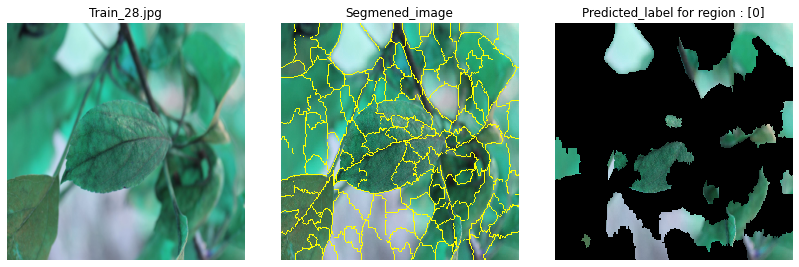

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(scab_misclas_id[:3])):
  segment_top_pixel(30,loaded_model,j,i+1)

#### Observations:

* for Train_22.jpg & Train_28.jpg, model fails in capturing the  scab regions in the prediction.
* For Train_27.jpg, the predition pixel is fails to capture the leaf data instead it is trying to predict from the background which is incorrect. So here higher "zoom" aumentation could help in capturing the right category
* For Train_28.jpg, model is trying capture the pattern of more backgroud leaves image so misleading of category. "zoom" augmentation technique could fix this problem

#### Analysis of correctly classified data for all the categories
* Here we will taking 1 sample from each categories to understand the model behaviour

In [ ]:
sample_data=[]
for i in range(4):
  sample=list(label_df[label_df['Actual_label']==i][label_df['Actual_label']==label_df['Predicted_label']]['image_id'])[:1]
  sample_data.extend(sample)

In [ ]:
label_df[label_df['image_id'].isin(sample_data)]

,image_id,Actual_label,Predicted_label
0,./images/Train_0.jpg,3,3
1,./images/Train_1.jpg,1,1
2,./images/Train_2.jpg,0,0
3,./images/Train_3.jpg,2,2


0it [00:00, ?it/s]

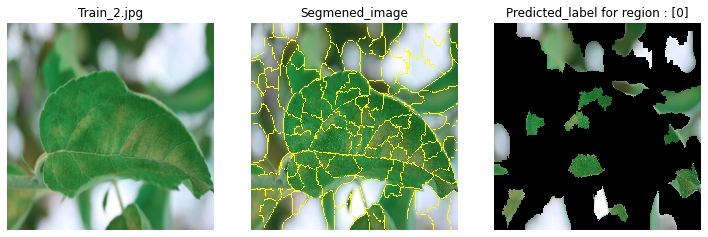

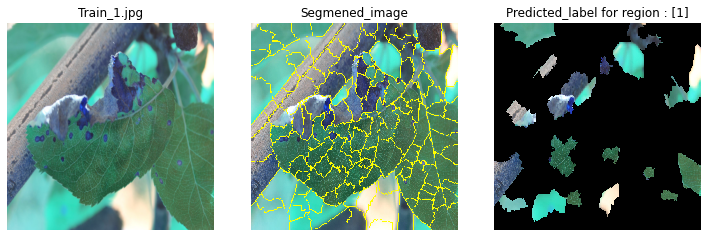

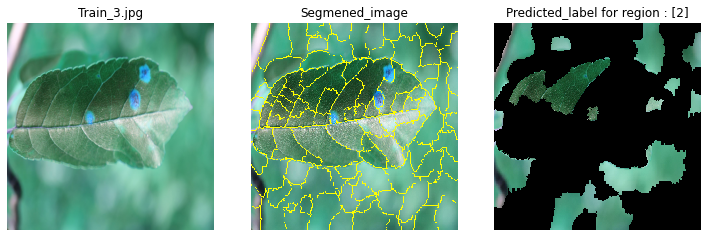

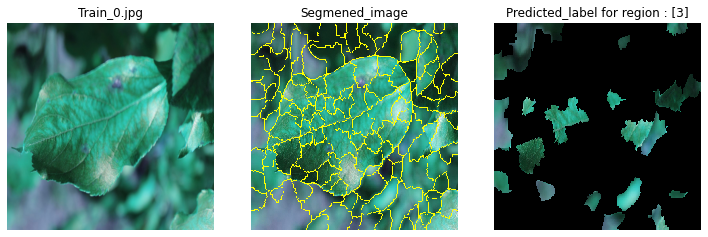

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(sample_data)):
  segment_top_pixel(30,loaded_model,j,i+1)

#### Observations:
* All the observations are made with 30 top pixels(features) of image
* From th sample images, Model is well capturing the scab and rust area of leaves and for helathy leaves it does not specify much info but model seems lagging in identifying he region for muti disease

### Model-2 DenseNet121(with Data Augmentation + 5 fold cv) Analysis
* Here in 5-fold cv method, we took average predictions from 5 models to predict the category. So for post training analysis we kept the data split constant so accuacy would vary from the trained model due to different split used during the training

In [ ]:
k_fold_model_1 = tf.keras.models.load_model('/content/drive/My Drive/best_model1_updated.hdf5')
k_fold_model_2 = tf.keras.models.load_model('/content/drive/My Drive/best_model2_updated.hdf5')
k_fold_model_3 = tf.keras.models.load_model('/content/drive/My Drive/best_model3_updated.hdf5')
k_fold_model_4 = tf.keras.models.load_model('/content/drive/My Drive/best_model4_updated.hdf5')
k_fold_model_5 = tf.keras.models.load_model('/content/drive/My Drive/best_model5_updated.hdf5')

 23/364 [>.............................] - ETA: 3:21

 23/364 [>.............................] - ETA: 3:21

 23/364 [>.............................] - ETA: 3:25

 23/364 [>.............................] - ETA: 4:56

 23/364 [>.............................] - ETA: 3:21

364/364 [==============================] - 15s 36ms/step


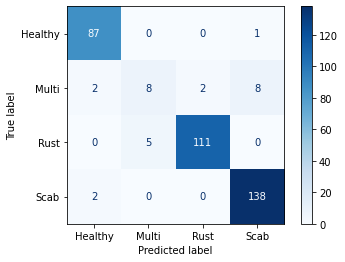

In [ ]:
valid_generator.reset()
pred_1=k_fold_model_1.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_2=k_fold_model_2.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_3=k_fold_model_3.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_4=k_fold_model_4.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_5=k_fold_model_5.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)

avg_pred=(pred_1+pred_2+pred_3+pred_4+pred_5)/5
#plotting function of accuracy,loss and auc
    
    #confusion_matrix on each fold
class_labels = ["Healthy", "Multi", "Rust", "Scab"]
cm = confusion_matrix(np.asarray(valid_generator._targets).argmax(axis=1), np.asarray(avg_pred).argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()

#### Observations:
* 94.5% average prediction is obtained
* Actual "multi_disease" class leaves are clasified as scab,rust and healthy. So we will be checking the pattern of misclassifying leaves
* 2 of Scab leaves are misclassified as "healthy leaves which needs to be analysed
* 5 of Rust leaves are classified as "multi_disease and 1 Healthy leaf classified as scab 

In [ ]:
#np.save('k_fold_Prediction_loaded_model.npy',avg_pred)

In [ ]:
# avg_pred_k_fold=np.load('Prediction_loaded_model.npy')

In [ ]:
label_df_2=pd.DataFrame({'Actual_label':np.asarray(valid_generator._targets).argmax(axis=1),'Predicted_label':np.asarray(avg_pred).argmax(axis=1)})
a=valid_generator._filepaths
label_df_2.insert(0,'image_id',pd.Series(a))
label_df_2.head(3)

,image_id,Actual_label,Predicted_label
0,./images/Train_0.jpg,3,3
1,./images/Train_1.jpg,1,1
2,./images/Train_2.jpg,0,0


In [ ]:
print("Total number of misclassified point are: ",len(label_df_2[label_df['Actual_label']!=label_df_2['Predicted_label']]))

Total number of misclassified point are:  20


In [ ]:
k_fold_models=[k_fold_model_1,k_fold_model_2,k_fold_model_3,k_fold_model_4,k_fold_model_5]

In [ ]:
##https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5
def segment_top_pixel_k_fold(num_top_features,k_fold_models,image_loc_id,i=1):
    """ num_top_features : Show the top pixel which classifies the leaves category
        k_fold_models   :Saved weights of the model trained
        image_loc_id  : ex: ./images/Train_2.jpg
        i  : to show more images pattern by default sigle input so 1
        num_top_features : no of pixel to select 
    """

    #printing the original image
    plt.figure(figsize=(12,10))
    plt.subplot(1,3,1)
    image=cv2.imread(image_loc_id)
    image=cv2.resize(image, (512, 320),interpolation = cv2.INTER_NEAREST)
    plt.imshow(image)
    plt.title('{}'.format(image_loc_id.split('/')[-1]))
    plt.axis('off')


    #printing the segmentation based on kernel (it is random segmentation)
    superpixels = skimage.segmentation.quickshift(image, kernel_size=5,max_dist=200, ratio=0.2,random_seed=42)
    num_superpixels = np.unique(superpixels).shape[0] #number of pixel to make the segmentation
    plt.subplot(1,3,2)
    skimage.io.imshow(skimage.segmentation.mark_boundaries(image, superpixels))
    plt.title('Segmened_image')
    plt.axis('off')


    #pertubation for randomly masking the image segments
    num_perturb = 30 #kept small since 5 models will consume more compute
    perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels)) 

    def perturb_image(img,perturbation,segments):
      active_pixels = np.where(perturbation == 1)[0] #taking only true part pertubation=1
      mask = np.zeros(segments.shape)
      for active in active_pixels:
          mask[segments == active] = 1  #masking the segments(superpixels) with pertubation=1
      perturbed_image = copy.deepcopy(img)
      perturbed_image = perturbed_image*mask[:,:,np.newaxis]
      return perturbed_image



    predictions = []
    
    #the below loop is performing prediction with masked and unmasked pixel of an image and storing the result and it iterates for no of pertubation choosen
    for pert in perturbations: #here it is looped to each pixel masked (num_perturb)
      perturbed_img = perturb_image(image/255,pert,superpixels) #passing into masking masking fuction

      data_kfold =pd.DataFrame()
      for index,model in enumerate(k_fold_models):
        pred = model.predict(perturbed_img[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
        pred1=pd.DataFrame(pred,columns=["healthy"+'{}'.format(index), "multiple_diseases"+'{}'.format(index), "rust"+'{}'.format(index),"scab"+'{}'.format(index)])
        pred1.reset_index(drop=True, inplace=True)
        data_kfold=pd.concat([data_kfold,pred1],axis=1)

      #print(data_kfold.shape)  
      final_df=pd.DataFrame()
      for i,j in enumerate(['healthy','multiple_diseases', 'rust', 'scab']):
        test_avg_column=pd.DataFrame(data_kfold.iloc[:,i::4].sum(axis=1)/5,columns=[j])
        final_df =pd.concat([final_df,test_avg_column],axis=1)

      predictions.append(np.array(final_df))
      #print(final_df.shape)  
    predictions = np.array(predictions) #storing all 150 set in an array

    original_image = np.ones(num_superpixels)[np.newaxis,:] #Perturbation with all superpixels enabled

    distances = sklearn.metrics.pairwise_distances(perturbations,original_image, metric='cosine').ravel() #finding the distance from (1,1,1) to randomly masked pixel set

    #predicting the classes with highest probability
    np.random.seed(42)
    data_kfold_1=pd.DataFrame()
    for index,model in enumerate(k_fold_models):
        pred = model.predict(image[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
        pred1=pd.DataFrame(pred,columns=["healthy"+'{}'.format(index), "multiple_diseases"+'{}'.format(index), "rust"+'{}'.format(index),"scab"+'{}'.format(index)])
        pred1.reset_index(drop=True, inplace=True)
        data_kfold_1=pd.concat([data_kfold,pred1],axis=1)
    final_df=pd.DataFrame()
    for i,j in enumerate(['healthy','multiple_diseases', 'rust', 'scab']):
        test_avg_column=pd.DataFrame(data_kfold_1.iloc[:,i::4].sum(axis=1)/5,columns=[j])
        final_df =pd.concat([final_df,test_avg_column],axis=1)
    top_pred_classes = np.array(final_df)[0].argsort()[-4:][::-1] #all the classes priority is predicted

    kernel_width = 0.25
    weights = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function RBL (Radial Basis Function)
    class_to_explain = top_pred_classes[0] 


    simpler_model = LinearRegression() #performing LR and fitting model for prediction of all the points and getting the maxium coefficient value from the prediction
    simpler_model.fit(X=perturbations, y=predictions[:,:,class_to_explain], sample_weight=weights)
    coeff = simpler_model.coef_[0] #(n_targets
    #predicts all the superpixel among which we will select the top 4 values which has highest values of predicted pixels
    
    top_features = np.argsort(coeff)[-num_top_features:] 

    plt.subplot(1,3,3)
    mask = np.zeros(num_superpixels) 
    mask[top_features]= True #Activate top superpixels
    skimage.io.imshow(perturb_image(image/255,mask,superpixels))
    plt.title('Predicted_label for region : {}'.format(list(label_df_2[label_df_2['image_id']==image_loc_id]['Predicted_label'])))
    plt.axis('off')
 


#### Analysis of misclassification "multiple_disease" leaves category

In [ ]:
# segment_top_pixel_k_fold(20,k_fold_models,'./images/Train_0.jpg',i=1)

In [ ]:
multi_d_misclas_id_k=pd.Series(label_df_2[label_df_2['Actual_label']==1][label_df_2['Actual_label']!=label_df_2['Predicted_label']]['image_id'])
print("Total misclassfied labels for multi_disease category are: ",len(multi_d_misclas_id_k))

Total misclassfied labels for multi_disease category are:  12


In [ ]:
label_df_2[label_df_2['image_id'].isin(list(multi_d_misclas_id_k[:3]))]

,image_id,Actual_label,Predicted_label
6,./images/Train_6.jpg,1,3
25,./images/Train_25.jpg,1,3
62,./images/Train_62.jpg,1,3


0it [00:00, ?it/s]

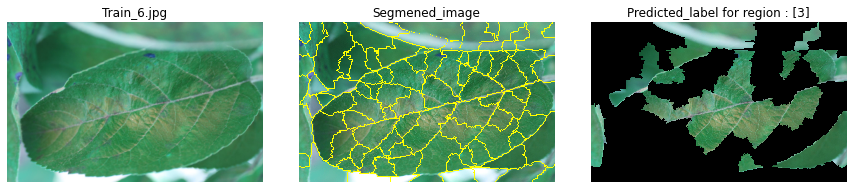

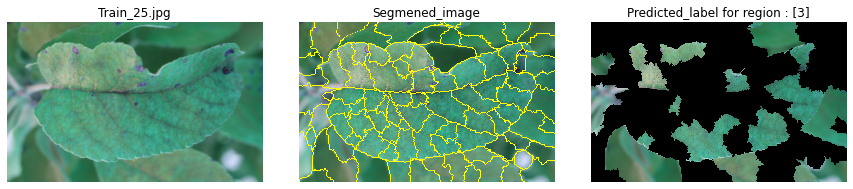

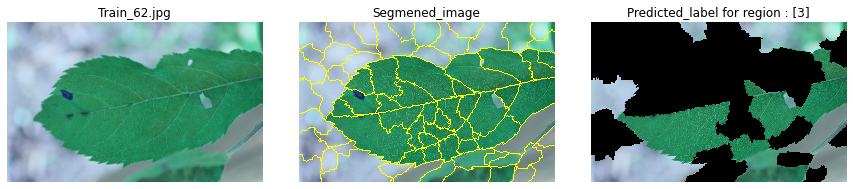

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(multi_d_misclas_id_k[:3])):
  segment_top_pixel_k_fold(30,k_fold_models,j,i+1)

##### Observations:
* Model lags in capturing the affected region(rust & scab area)
* As scab area is domination on the leaves so model is getting biased towards the scab than the mult_disease


#### Analysis of misclassification "Rust" leaves category

In [ ]:
rust_misclas_id_k=pd.Series(label_df_2[label_df_2['Actual_label']==2][label_df_2['Actual_label']!=label_df_2['Predicted_label']]['image_id'])
print("Total misclassfied labels for rust category are: ",len(rust_misclas_id_k))

Total misclassfied labels for rust category are:  5


In [ ]:
label_df_2[label_df_2['image_id'].isin(list(rust_misclas_id_k[:]))]

,image_id,Actual_label,Predicted_label
171,./images/Train_171.jpg,2,1
188,./images/Train_188.jpg,2,1
284,./images/Train_284.jpg,2,1
294,./images/Train_294.jpg,2,1
313,./images/Train_313.jpg,2,1


0it [00:00, ?it/s]

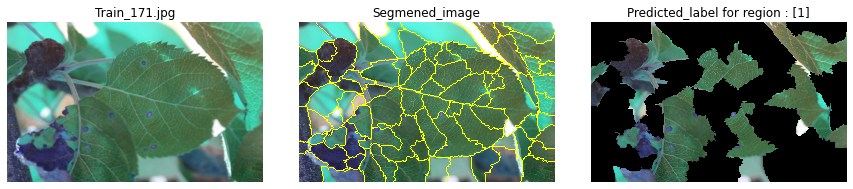

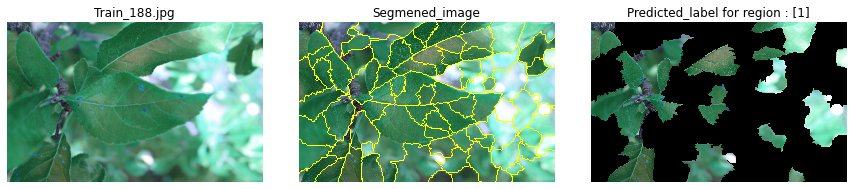

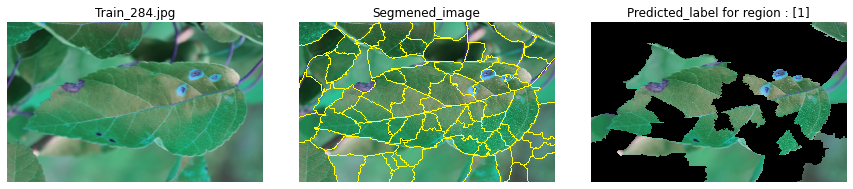

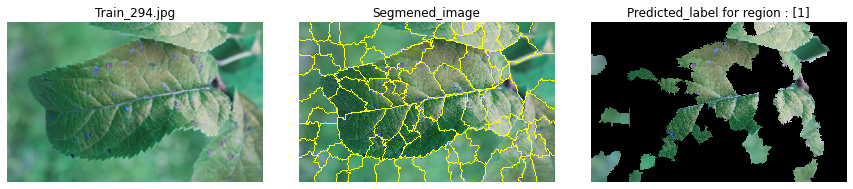

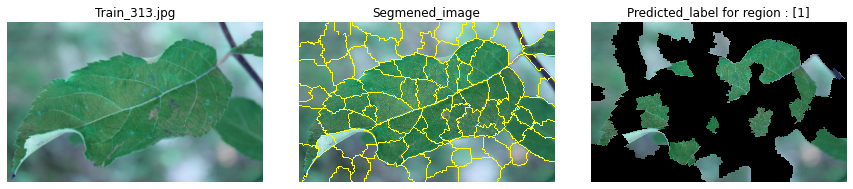

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(rust_misclas_id_k[:])): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(30,k_fold_models,j,i+1)

#### Observations:
* Train_294.jpg & Train_171.jpg are seems multi_disease class of leaves. It could be wrong ground truth value assigned.
* Due to less brigtness of leaf image model fails in identifying only rust category for other misclassified images

#### Analysis of misclassification "Scab" leaves category

In [ ]:
scab_misclas_id_k=pd.Series(label_df_2[label_df_2['Actual_label']==3][label_df_2['Actual_label']!=label_df_2['Predicted_label']]['image_id'])
print("Total misclassfied labels for scab category are: ",len(scab_misclas_id_k))

Total misclassfied labels for scab category are:  2


In [ ]:
label_df_2[label_df_2['image_id'].isin(list(scab_misclas_id_k[:]))]

,image_id,Actual_label,Predicted_label
27,./images/Train_27.jpg,3,0
303,./images/Train_303.jpg,3,0


0it [00:00, ?it/s]

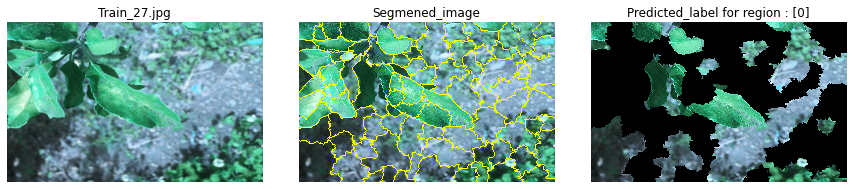

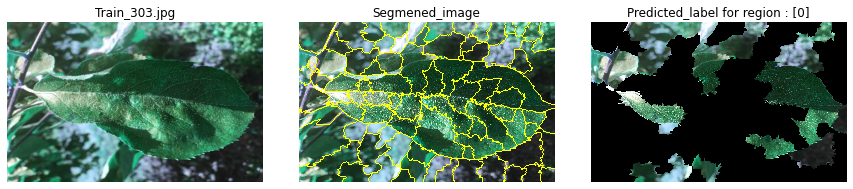

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(scab_misclas_id_k[:])): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(30,k_fold_models,j,i+1)

#### Observations:
* Model lags in identifying the pattern of scab area in Train_303.jpg image. Brighnes sugmentation should help here
* Train_27.jpg is having multiple leaves where model is failing to recognize the disease

#### Analysis of misclassification "Healthy" leaf category

In [ ]:
healthy_misclas_id_k=pd.Series(label_df_2[label_df_2['Actual_label']==0][label_df_2['Actual_label']!=label_df_2['Predicted_label']]['image_id'])
print("Total misclassfied labels for scab category are: ",len(healthy_misclas_id_k))

Total misclassfied labels for scab category are:  1


In [ ]:
label_df_2[label_df_2['image_id'].isin(list(healthy_misclas_id_k[:]))]

,image_id,Actual_label,Predicted_label
9,./images/Train_9.jpg,0,3


0it [00:00, ?it/s]

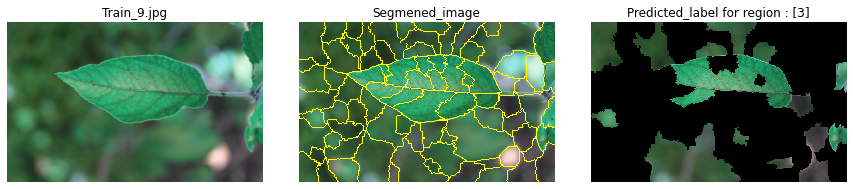

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(healthy_misclas_id_k)): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(30,k_fold_models,j,i+1)

#### observation:
* Model is capturing more background pixels in idefying the category. So it fails to capture the correct region

### Model-3 EfficientNetB7 (Data Augmentation + 5-Fold CV) Analysis

In [ ]:
from keras_preprocessing.image import ImageDataGenerator
val_datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.20)

In [ ]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test_df,
directory="./images/",
x_col="image_id",
y_col=None,
batch_size=1,
seed=42,
shuffle=False,
class_mode=None,
target_size=(320,512))

In [ ]:
k_fold_eff_1 = tf.keras.models.load_model('/content/drive/My Drive/best_model_b71.hdf5')
k_fold_eff_2 = tf.keras.models.load_model('/content/drive/My Drive/best_model_b72.hdf5')
k_fold_eff_3 = tf.keras.models.load_model('/content/drive/My Drive/best_model_b73.hdf5')
k_fold_eff_4 = tf.keras.models.load_model('/content/drive/My Drive/best_model_b74.hdf5')
k_fold_eff_5 = tf.keras.models.load_model('/content/drive/My Drive/best_model_b75.hdf5')

In [ ]:
valid_generator.reset()
pred_1=k_fold_eff_1.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_2=k_fold_eff_2.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_3=k_fold_eff_3.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_4=k_fold_eff_4.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)
pred_5=k_fold_eff_5.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)

 23/364 [>.............................] - ETA: 4:00

 23/364 [>.............................] - ETA: 5:35

 23/364 [>.............................] - ETA: 4:23

 23/364 [>.............................] - ETA: 5:09

 23/364 [>.............................] - ETA: 4:44

364/364 [==============================] - 20s 51ms/step


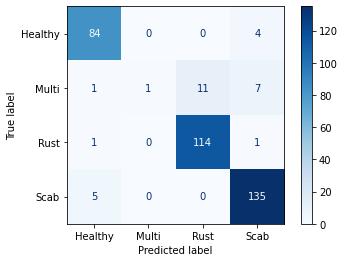

In [ ]:
avg_pred=(pred_1+pred_2+pred_3+pred_4+pred_5)/5
#plotting function of accuracy,loss and auc
    
#confusion_matrix on each fold
class_labels = ["Healthy", "Multi", "Rust", "Scab"]
cm = confusion_matrix(np.asarray(valid_generator._targets).argmax(axis=1), np.asarray(avg_pred).argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [ ]:
np.save('k_fold_eff_b7_pred.npy',avg_pred)

In [ ]:
label_df_b7=pd.DataFrame({'Actual_label':np.asarray(valid_generator._targets).argmax(axis=1),'Predicted_label':np.asarray(avg_pred).argmax(axis=1)})
a=valid_generator._filepaths
label_df_b7.insert(0,'image_id',pd.Series(a))
label_df_b7.head(3)

,image_id,Actual_label,Predicted_label
0,./images/Train_0.jpg,3,3
1,./images/Train_1.jpg,1,2
2,./images/Train_2.jpg,0,0


In [ ]:
print("Total number of misclassified point are: ",len(label_df_b7[label_df_b7['Actual_label']!=label_df_b7['Predicted_label']]))

Total number of misclassified point are:  30


In [ ]:
k_fold_eff=[k_fold_eff_1,k_fold_eff_2,k_fold_eff_3,k_fold_eff_4,k_fold_eff_5]

In [ ]:
##https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5
def segment_top_pixel_k_fold(num_top_features,k_fold_models,image_loc_id,i=1):
    """ num_top_features : Show the top pixel which classifies the leaves category
        k_fold_models   :Saved weights of the model trained
        image_loc_id  : ex: ./images/Train_2.jpg
        i  : to show more images pattern by default sigle input so 1
        num_top_features : no of pixel to select 
    """

    #printing the original image
    plt.figure(figsize=(12,10))
    plt.subplot(1,3,1)
    image=cv2.imread(image_loc_id)
    image=cv2.resize(image, (512, 320),interpolation = cv2.INTER_NEAREST)
    plt.imshow(image)
    plt.title('{}'.format(image_loc_id.split('/')[-1]))
    plt.axis('off')


    #printing the segmentation based on kernel (it is random segmentation)
    superpixels = skimage.segmentation.quickshift(image, kernel_size=5,max_dist=200, ratio=0.2,random_seed=42)
    num_superpixels = np.unique(superpixels).shape[0] #number of pixel to make the segmentation
    plt.subplot(1,3,2)
    skimage.io.imshow(skimage.segmentation.mark_boundaries(image, superpixels))
    plt.title('Segmened_image')
    plt.axis('off')


    #pertubation for randomly masking the image segments
    num_perturb = 30 #kept small since 5 models will consume more compute
    perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels)) 

    def perturb_image(img,perturbation,segments):
      active_pixels = np.where(perturbation == 1)[0] #taking only true part pertubation=1
      mask = np.zeros(segments.shape)
      for active in active_pixels:
          mask[segments == active] = 1  #masking the segments(superpixels) with pertubation=1
      perturbed_image = copy.deepcopy(img)
      perturbed_image = perturbed_image*mask[:,:,np.newaxis]
      return perturbed_image



    predictions = []
    
    #the below loop is performing prediction with masked and unmasked pixel of an image and storing the result and it iterates for no of pertubation choosen
    for pert in perturbations: #here it is looped to each pixel masked (num_perturb)
      perturbed_img = perturb_image(image/255,pert,superpixels) #passing into masking masking fuction

      data_kfold =pd.DataFrame()
      for index,model in enumerate(k_fold_models):
        pred = model.predict(perturbed_img[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
        pred1=pd.DataFrame(pred,columns=["healthy"+'{}'.format(index), "multiple_diseases"+'{}'.format(index), "rust"+'{}'.format(index),"scab"+'{}'.format(index)])
        pred1.reset_index(drop=True, inplace=True)
        data_kfold=pd.concat([data_kfold,pred1],axis=1)

      #print(data_kfold.shape)  
      final_df=pd.DataFrame()
      for i,j in enumerate(['healthy','multiple_diseases', 'rust', 'scab']):
        test_avg_column=pd.DataFrame(data_kfold.iloc[:,i::4].sum(axis=1)/5,columns=[j])
        final_df =pd.concat([final_df,test_avg_column],axis=1)

      predictions.append(np.array(final_df))
      #print(final_df.shape)  
    predictions = np.array(predictions) #storing all 150 set in an array

    original_image = np.ones(num_superpixels)[np.newaxis,:] #Perturbation with all superpixels enabled

    distances = sklearn.metrics.pairwise_distances(perturbations,original_image, metric='cosine').ravel() #finding the distance from (1,1,1) to randomly masked pixel set

    #predicting the classes with highest probability
    np.random.seed(42)
    data_kfold_1=pd.DataFrame()
    for index,model in enumerate(k_fold_models):
        pred = model.predict(image[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
        pred1=pd.DataFrame(pred,columns=["healthy"+'{}'.format(index), "multiple_diseases"+'{}'.format(index), "rust"+'{}'.format(index),"scab"+'{}'.format(index)])
        pred1.reset_index(drop=True, inplace=True)
        data_kfold_1=pd.concat([data_kfold,pred1],axis=1)
    final_df=pd.DataFrame()
    for i,j in enumerate(['healthy','multiple_diseases', 'rust', 'scab']):
        test_avg_column=pd.DataFrame(data_kfold_1.iloc[:,i::4].sum(axis=1)/5,columns=[j])
        final_df =pd.concat([final_df,test_avg_column],axis=1)
    top_pred_classes = np.array(final_df)[0].argsort()[-4:][::-1] #all the classes priority is predicted

    kernel_width = 0.25
    weights = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function RBL (Radial Basis Function)
    class_to_explain = top_pred_classes[0] 


    simpler_model = LinearRegression() #performing LR and fitting model for prediction of all the points and getting the maxium coefficient value from the prediction
    simpler_model.fit(X=perturbations, y=predictions[:,:,class_to_explain], sample_weight=weights)
    coeff = simpler_model.coef_[0] #(n_targets
    #predicts all the superpixel among which we will select the top 4 values which has highest values of predicted pixels
    
    top_features = np.argsort(coeff)[-num_top_features:] 

    plt.subplot(1,3,3)
    mask = np.zeros(num_superpixels) 
    mask[top_features]= True #Activate top superpixels
    skimage.io.imshow(perturb_image(image/255,mask,superpixels))
    plt.title('Predicted_label for region : {}'.format(list(label_df_b7[label_df_b7['image_id']==image_loc_id]['Predicted_label'])))
    plt.axis('off')
 


#### Analysis of "multi_disease" category misclassification

In [ ]:
multi_d_misclas_b7_k=pd.Series(label_df_b7[label_df_b7['Actual_label']==1][label_df_b7['Actual_label']!=label_df_b7['Predicted_label']]['image_id'])
print("Total misclassfied labels for multi_disease category are: ",len(multi_d_misclas_b7_k))

Total misclassfied labels for multi_disease category are:  19


In [ ]:
label_df_b7[label_df_b7['image_id'].isin(list(multi_d_misclas_b7_k[:5]))]

,image_id,Actual_label,Predicted_label
1,./images/Train_1.jpg,1,2
6,./images/Train_6.jpg,1,3
25,./images/Train_25.jpg,1,3
36,./images/Train_36.jpg,1,2
62,./images/Train_62.jpg,1,2


0it [00:00, ?it/s]

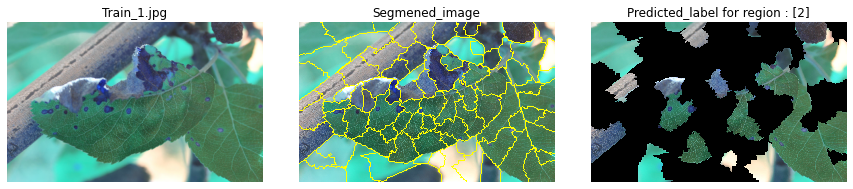

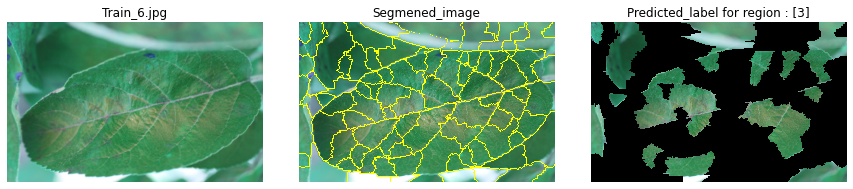

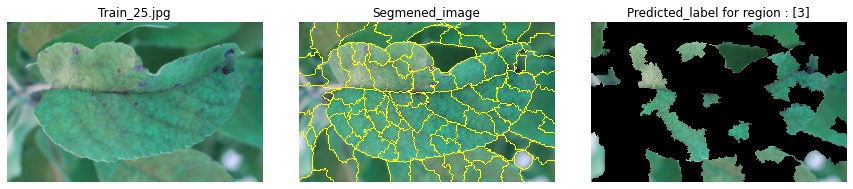

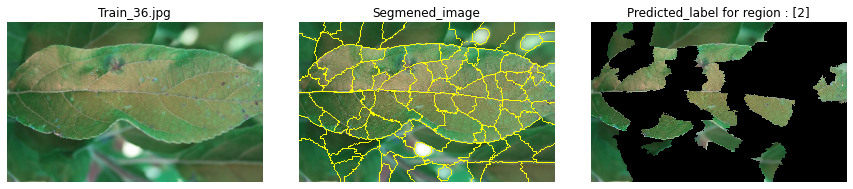

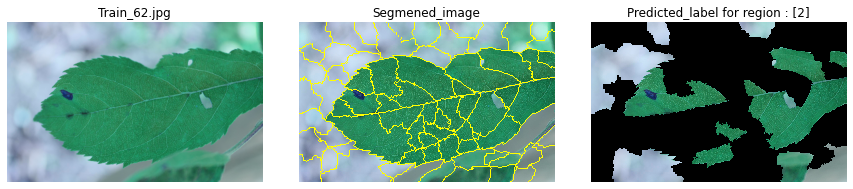

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(multi_d_misclas_b7_k[:5])):
  segment_top_pixel_k_fold(30,k_fold_eff,j,i+1)

#### observation:
* Due to majority of scb and rust category leaves , Model is biasing towards it tereby failing to capture multi affected region of leaf.


#### Analysis of "Scab" category misclassification

In [ ]:
scab_misclas_b7_k=pd.Series(label_df_b7[label_df_b7['Actual_label']==3][label_df_b7['Actual_label']!=label_df_b7['Predicted_label']]['image_id'])

In [ ]:
print("Total misclassfied labels for scab category are: ",len(scab_misclas_b7_k))

Total misclassfied labels for scab category are:  5


In [ ]:
label_df_b7[label_df_b7['image_id'].isin(list(scab_misclas_b7_k[:5]))]

,image_id,Actual_label,Predicted_label
256,./images/Train_256.jpg,3,0
258,./images/Train_258.jpg,3,0
303,./images/Train_303.jpg,3,0
316,./images/Train_316.jpg,3,0
326,./images/Train_326.jpg,3,0


0it [00:00, ?it/s]

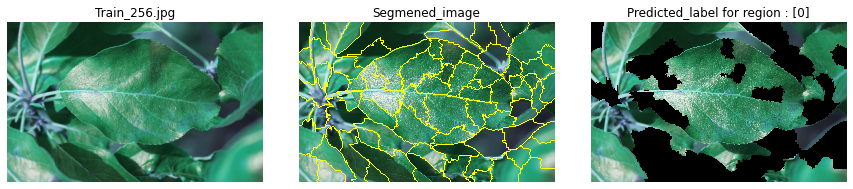

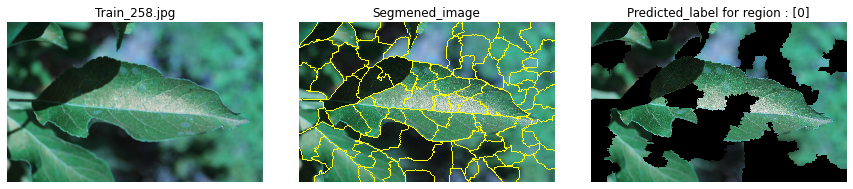

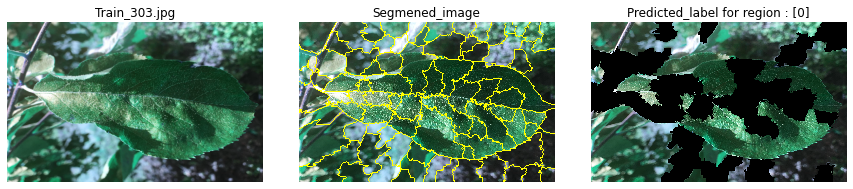

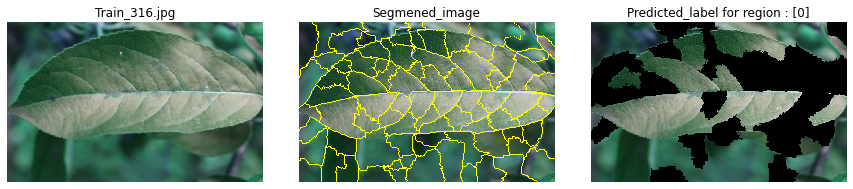

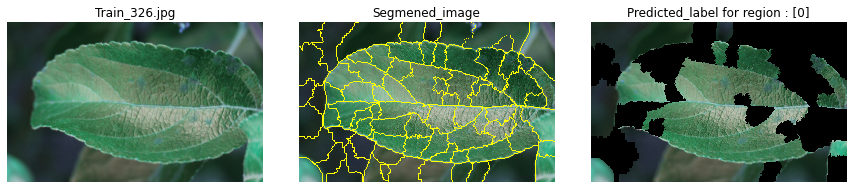

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(scab_misclas_b7_k[:5])): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(50,k_fold_eff,j,i+1)

##### Observation:
* Brightness of the image is misleading to Health image as scab area gets unnoticed by model. So reducing brightness could help in model to classify correctly


#### Analysis of misclassification "Healthy" leaf category

In [ ]:
healthy_misclas_b7_k=pd.Series(label_df_b7[label_df_b7['Actual_label']==0][label_df_b7['Actual_label']!=label_df_b7['Predicted_label']]['image_id'])
print("Total misclassfied labels for scab category are: ",len(healthy_misclas_b7_k))

Total misclassfied labels for scab category are:  4


In [ ]:
label_df_b7[label_df_b7['image_id'].isin(list(healthy_misclas_b7_k[:]))]

,image_id,Actual_label,Predicted_label
5,./images/Train_5.jpg,0,3
9,./images/Train_9.jpg,0,3
320,./images/Train_320.jpg,0,3
329,./images/Train_329.jpg,0,3


0it [00:00, ?it/s]

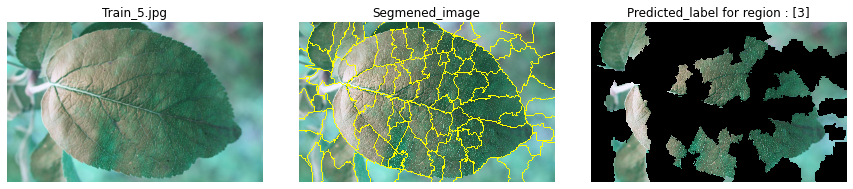

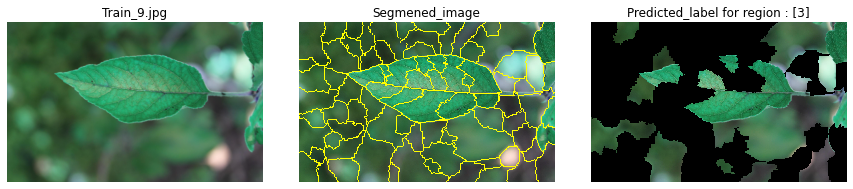

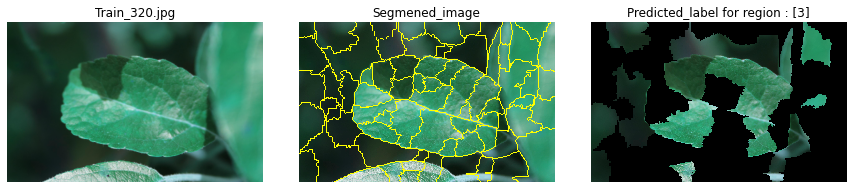

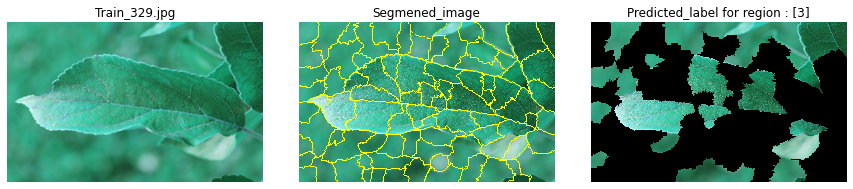

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(healthy_misclas_b7_k)): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(30,k_fold_eff,j,i+1)

#### observations:
* Train_5.jpg is having pale color of leaf which could make model misclassified.
* For othe 3 images, Model is more concentrating on background data than the leaf area

#### Analysis of misclassification "Rust" leaves category

In [ ]:
rust_misclas_b7_k=pd.Series(label_df_b7[label_df_b7['Actual_label']==2][label_df_b7['Actual_label']!=label_df_b7['Predicted_label']]['image_id'])
print("Total misclassfied labels for rust category are: ",len(rust_misclas_b7_k))

Total misclassfied labels for rust category are:  2


In [ ]:
label_df_b7[label_df_b7['image_id'].isin(list(rust_misclas_b7_k[:]))]

,image_id,Actual_label,Predicted_label
188,./images/Train_188.jpg,2,3
225,./images/Train_225.jpg,2,0


0it [00:00, ?it/s]

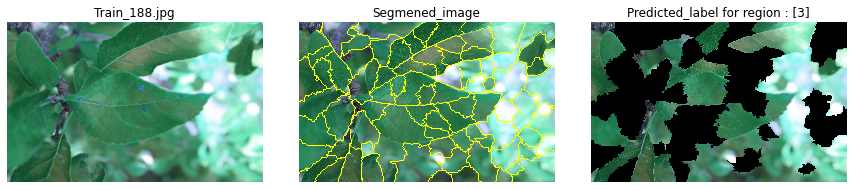

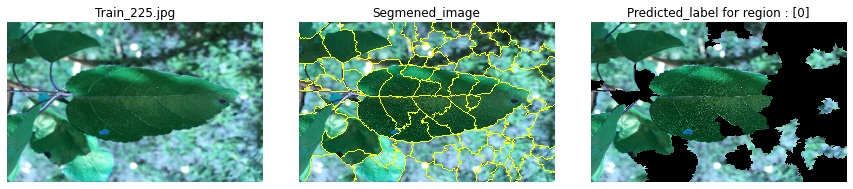

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(rust_misclas_b7_k[:])): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel_k_fold(50,k_fold_eff,j,i+1)

##### observations:
* Model is more capturing the background pixel for categorization. So higher zoom range could solve the issue

### Model-4 EfficientNetB7 (Data Augmentation + Smote) Analysis

In [ ]:
val_datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.20)

In [ ]:
valid_generator=val_datagen.flow_from_dataframe(
dataframe=train_df,
directory="./images/",
x_col="image_id",
y_col=train_df.columns[1:].str.replace(' ', ''),
subset="validation",
batch_size=16,
seed=42,
shuffle=False, #is required to freeze the validation data while testing else different result is obtained 
class_mode="raw", #https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c
target_size=(300,300))

Found 1457 validated image filenames.
Found 364 validated image filenames.


In [ ]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test_df,
directory="./images/",
x_col="image_id",
y_col=None,
batch_size=1,
seed=42,
shuffle=False,
class_mode=None,
target_size=(320,512))

Found 1821 validated image filenames.


In [ ]:
eff_b7_smote = tf.keras.models.load_model('best_mdel_smote.hdf5')

364/364 [==============================] - 19s 38ms/step


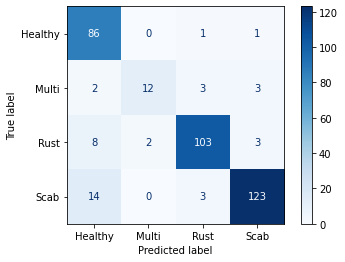

In [ ]:
valid_generator.reset()
pred_1=eff_b7_smote.predict_generator(valid_generator,steps=valid_generator.n,verbose=1)

#plotting function of accuracy,loss and auc
    
    #confusion_matrix on each fold
class_labels = ["Healthy", "Multi", "Rust", "Scab"]
cm = confusion_matrix(np.asarray(valid_generator._targets).argmax(axis=1), np.asarray(pred_1).argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()

#### Observations:
* Here 89.01 accuarcy is achived
* We see model is performing good in "multi_disease" category comparing to other trained model. However It is highly misclasifying the scab and rust leaves


In [ ]:
import numpy as np
np.save('Prediction_loaded_model.npy',pred_1)

In [ ]:
label_df_3=pd.DataFrame({'Actual_label':np.asarray(valid_generator._targets).argmax(axis=1),'Predicted_label':np.asarray(pred_1).argmax(axis=1)})
a=valid_generator._filepaths
label_df_3.insert(0,'image_id',pd.Series(a))
label_df_3.head(3)

,image_id,Actual_label,Predicted_label
0,./images/Train_0.jpg,3,3
1,./images/Train_1.jpg,1,2
2,./images/Train_2.jpg,0,0


In [ ]:
print("Total number of misclassified point are: ",len(label_df_3[label_df_3['Actual_label']!=label_df_3['Predicted_label']]))

Total number of misclassified point are:  40


In [ ]:
##https://towardsdatascience.com/interpreting-image-classification-model-with-lime-1e7064a2f2e5
def segment_top_pixel(num_top_features,loaded_model,image_loc_id,i=1):
    """ num_top_features : Show the top pixel which classifies the leaves category
        loaded_model   :Saved weights of the model trained
        image_loc_id  : ex: ./images/Train_2.jpg
        i  : to show more images pattern by default sigle input so 1
        num_top_features : no of pixel to select 
    """

    #printing the original image
    plt.figure(figsize=(10,8))
    plt.subplot(1,3,1)
    image=cv2.imread(image_loc_id)
    image=cv2.resize(image, (300, 300),interpolation = cv2.INTER_NEAREST)
    plt.imshow(image)
    plt.title('{}'.format(j.split('/')[-1]))
    plt.axis('off')


    #printing the segmentation based on kernel (it is random segmentation)
    superpixels = skimage.segmentation.quickshift(image, kernel_size=5,max_dist=200, ratio=0.2,random_seed=42)
    num_superpixels = np.unique(superpixels).shape[0] #number of pixel to make the segmentation
    plt.subplot(1,3,2)
    skimage.io.imshow(skimage.segmentation.mark_boundaries(image, superpixels))
    plt.title('Segmened_image')
    plt.axis('off')


    #pertubation for randomly masking the image segments
    num_perturb = 50
    perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels)) 

    def perturb_image(img,perturbation,segments):
      active_pixels = np.where(perturbation == 1)[0] #taking only true part pertubation=1
      mask = np.zeros(segments.shape)
      for active in active_pixels:
          mask[segments == active] = 1  #masking the segments(superpixels) with pertubation=1
      perturbed_image = copy.deepcopy(img)
      perturbed_image = perturbed_image*mask[:,:,np.newaxis]
      return perturbed_image

    # plt.subplot(i,4,3)
    # #sample masked image in one of the masked set
    # skimage.io.imshow(perturb_image(image/255,perturbations[0],superpixels)) #only superpixels with state=1 are masked
    # plt.title('masked_image_0')
    # plt.axis('off')

    predictions = []

    #the below loop is performing prediction with masked and unmasked pixel of an image and storing the result and it iterates for no of pertubation choosen
    for pert in perturbations: #here it is looped to each pixel masked (num_perturb)
      perturbed_img = perturb_image(image/255,pert,superpixels) #passing into masking masking fuction
      pred = loaded_model.predict(perturbed_img[np.newaxis,:,:,:]) #predicting on the masked pixel and storing
      predictions.append(pred)

    predictions = np.array(predictions) #storing all 150 set in an array

    original_image = np.ones(num_superpixels)[np.newaxis,:] #Perturbation with all superpixels enabled

    distances = sklearn.metrics.pairwise_distances(perturbations,original_image, metric='cosine').ravel() #finding the distance from (1,1,1) to randomly masked pixel set

    #predicting the classes with highest probability
    np.random.seed(42)
    preds = loaded_model.predict(image[np.newaxis,:,:,:])
    top_pred_classes = preds[0].argsort()[-4:][::-1] #all the classes priority is predicted

    kernel_width = 0.25
    weights = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function RBL (Radial Basis Function)
    class_to_explain = top_pred_classes[0] 


    simpler_model = LinearRegression() #performing LR and fitting model for prediction of all the points and getting the maxium coefficient value from the prediction
    simpler_model.fit(X=perturbations, y=predictions[:,:,class_to_explain], sample_weight=weights)
    coeff = simpler_model.coef_[0] #(n_targets
    #predicts all the superpixel among which we will select the top 4 values which has highest values of predicted pixels
    
    top_features = np.argsort(coeff)[-num_top_features:] 

    plt.subplot(1,3,3)
    mask = np.zeros(num_superpixels) 
    mask[top_features]= True #Activate top superpixels
    skimage.io.imshow(perturb_image(image/255,mask,superpixels))
    plt.title('Predicted_label for region : {}'.format(list(label_df_3[label_df_3['image_id']==image_loc_id]['Predicted_label'])))
    plt.axis('off')
 

#### Analysis of "Multi_disease" category misclassification

In [ ]:
multi_d_misclas_b7_smote=pd.Series(label_df_3[label_df_3['Actual_label']==1][label_df_3['Actual_label']!=label_df_3['Predicted_label']]['image_id'])

In [ ]:
print("Total misclassfied labels for multi_disease category are: ",len(multi_d_misclas_b7_smote))

Total misclassfied labels for multi_disease category are:  8


In [ ]:
label_df_3[label_df_3['image_id'].isin(list(multi_d_misclas_b7_smote[:3]))]

,image_id,Actual_label,Predicted_label
1,./images/Train_1.jpg,1,2
6,./images/Train_6.jpg,1,3
62,./images/Train_62.jpg,1,3


0it [00:00, ?it/s]

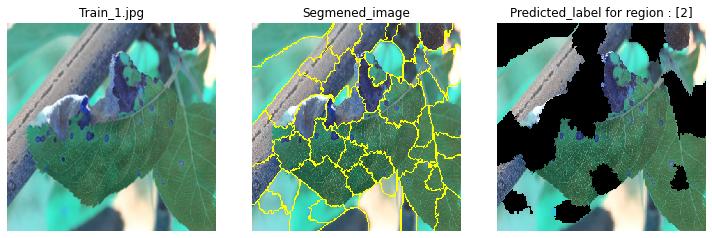

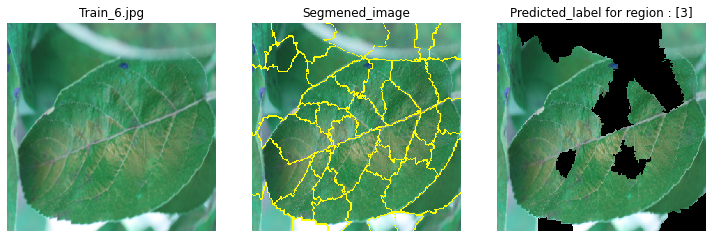

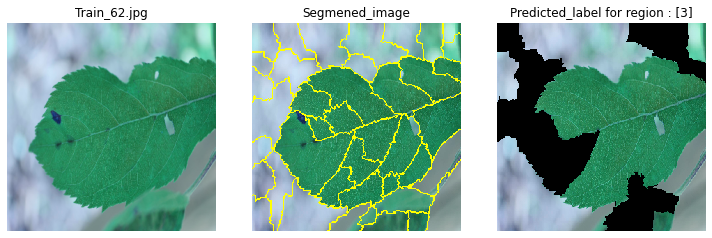

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(multi_d_misclas_b7_smote[:3])):
  segment_top_pixel(30,eff_b7_smote,j,i+1)

#### Analysis of "Scab" category misclassification

In [ ]:
scab_misclas_b7_smote_id=pd.Series(label_df_3[label_df_3['Actual_label']==3][label_df_3['Actual_label']!=label_df_3['Predicted_label']]['image_id'])

In [ ]:
print("Total misclassfied labels for scab category are: ",len(scab_misclas_b7_smote_id))

Total misclassfied labels for scab category are:  17


In [ ]:
label_df_3[label_df_3['image_id'].isin(list(scab_misclas_b7_smote_id[:3]))]

,image_id,Actual_label,Predicted_label
7,./images/Train_7.jpg,3,0
8,./images/Train_8.jpg,3,0
22,./images/Train_22.jpg,3,2


0it [00:00, ?it/s]

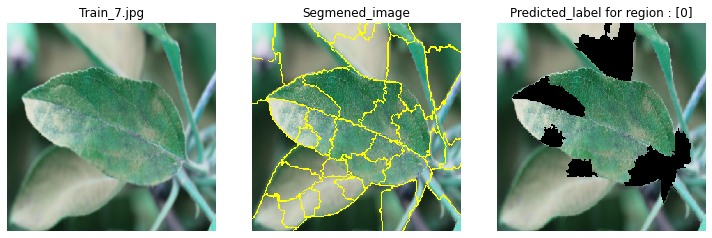

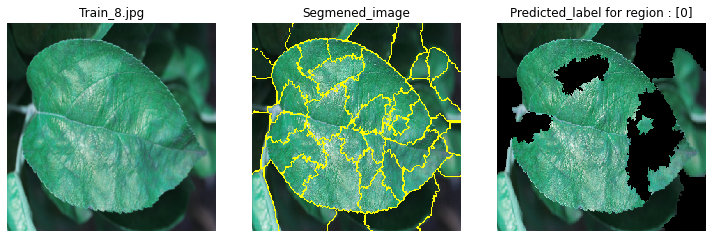

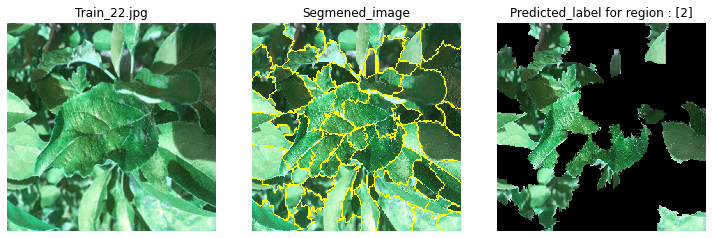

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(scab_misclas_b7_smote_id[:3])):
  segment_top_pixel(30,eff_b7_smote,j,i+1)

##### observation:
* Model is clasifying to Healthy since brightness of image is dominating than the disease. So reduction of brightness could solve

##### Analysis of misclassification "Rust" leaves category

In [ ]:
rust_misclas_b7_smote=pd.Series(label_df_3[label_df_3['Actual_label']==2][label_df_3['Actual_label']!=label_df_3['Predicted_label']]['image_id'])
print("Total misclassfied labels for rust category are: ",len(rust_misclas_b7_smote))

Total misclassfied labels for rust category are:  13


In [ ]:
label_df_3[label_df_3['image_id'].isin(list(rust_misclas_b7_smote[:5]))]

,image_id,Actual_label,Predicted_label
34,./images/Train_34.jpg,2,0
59,./images/Train_59.jpg,2,3
60,./images/Train_60.jpg,2,0
89,./images/Train_89.jpg,2,1
117,./images/Train_117.jpg,2,0


0it [00:00, ?it/s]

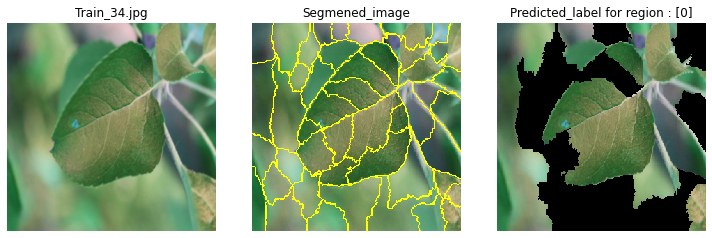

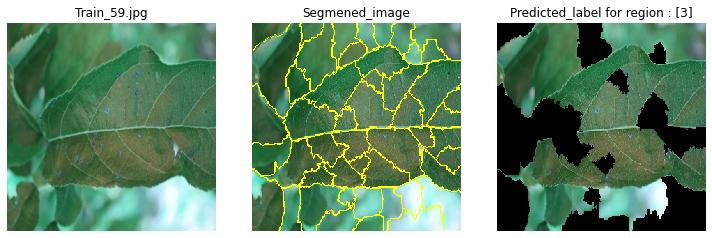

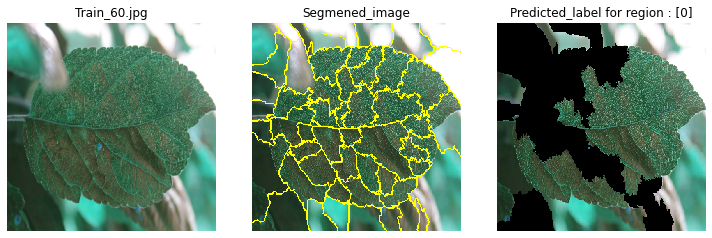

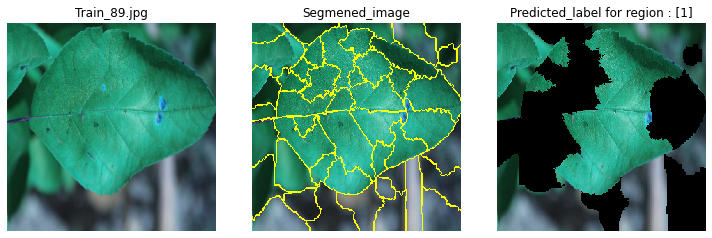

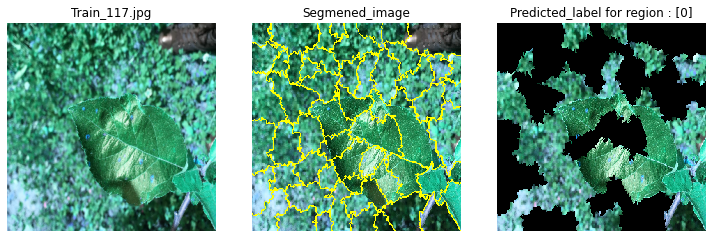

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(rust_misclas_b7_smote[:5])): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel(30,eff_b7_smote,j,i+1)

##### observations:
* Here model for Train_117.jpg is capturing more backgroung pixel of leaf to categorize. Higher zoom range could help
* Train_34.jpg,Train_59.jpg and Train_60.jpg images are having less brightness and small amount of rust is spread so "zoom" could help 

#### Analysis of misclassification "Healthy" leaf category

In [ ]:
healthy_misclas_b7_smote=pd.Series(label_df_3[label_df_3['Actual_label']==0][label_df_3['Actual_label']!=label_df_3['Predicted_label']]['image_id'])
print("Total misclassfied labels for scab category are: ",len(healthy_misclas_b7_smote))

Total misclassfied labels for scab category are:  2


In [ ]:
label_df_3[label_df_3['image_id'].isin(list(healthy_misclas_b7_smote[:]))]

,image_id,Actual_label,Predicted_label
9,./images/Train_9.jpg,0,3
307,./images/Train_307.jpg,0,2


0it [00:00, ?it/s]

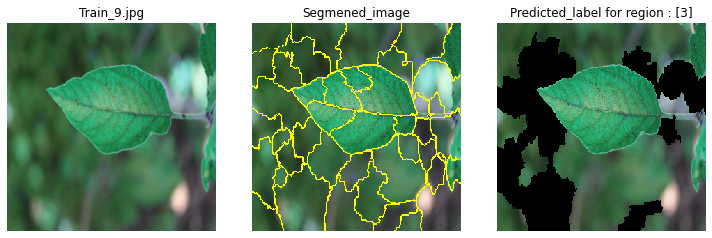

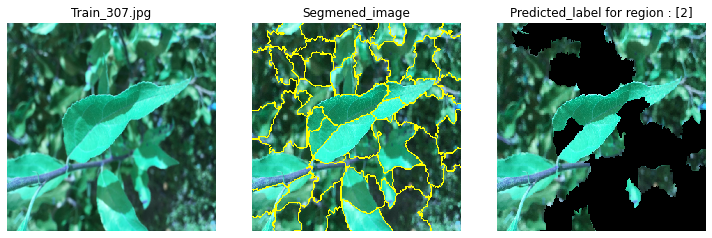

In [ ]:
from tqdm.notebook import tqdm
for i,j in tqdm(enumerate(healthy_misclas_b7_smote)): #there are only 5 miclassified for rust cayegory 
  segment_top_pixel(30,eff_b7_smote,j,i+1)

##### observations:
* Here Model is capturing patten of more backgroud pixels of image so which is misleding.

#### References
* https://colab.research.google.com/github/arteagac/arteagac.github.io/blob/master/blog/lime_image.ipynb#scrollTo=uq9q-_zXgqtV